# **CAT VS DOG**

## **SELF** LEARNING

In [3]:
import tensorflow_datasets as tfds

tfds.__version__

'2.1.0'

In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import tensorflow as tf
print(tf.__version__)

2.3.0


### **LOAD IMAGES**

Tensorflow_datasets URL : <br>
https://www.tensorflow.org/datasets/api_docs/python/tfds/load <br>

* with_info : bool, if True, tfds.load will return the tuple (tf.data.Dataset, tfds.core.DatasetInfo) containing the info associated with the builder.<br>
* as_supervised : bool, if True, the returned tf.data.Dataset will have a 2-tuple structure (input, label) according to builder.info.supervised_keys. If False, the default, the returned tf.data.Dataset will have a dictionary with all the features.

In [4]:
(raw_train, raw_validation, raw_test), metadata = tfds.load('cats_vs_dogs',
                                                            split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
                                                            with_info=True,
                                                            as_supervised=True,)

Shuffling and writing examples to /root/tensorflow_datasets/cats_vs_dogs/4.0.0.incompleteB7BH97/cats_vs_dogs-train.tfrecord



Dataset cats_vs_dogs downloaded and prepared to /root/tensorflow_datasets/cats_vs_dogs/4.0.0. Subsequent calls will reuse this data.


In [5]:
print(raw_train)
print(raw_validation)
print(raw_test)
#모든 데이터셋은 (image, label)형태로 되어있음

#image는 (none,none,3)의 shape를 가지고 있다 
#각 이미지는 사이즈가 다 달라 none으로 표기 되어있음 
#숫자 3은 RGB로 컬러 이미지라는 걸 의미함 
type(raw_train)

<DatasetV1Adapter shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<DatasetV1Adapter shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<DatasetV1Adapter shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


tensorflow.python.data.ops.dataset_ops.DatasetV1Adapter

In [6]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

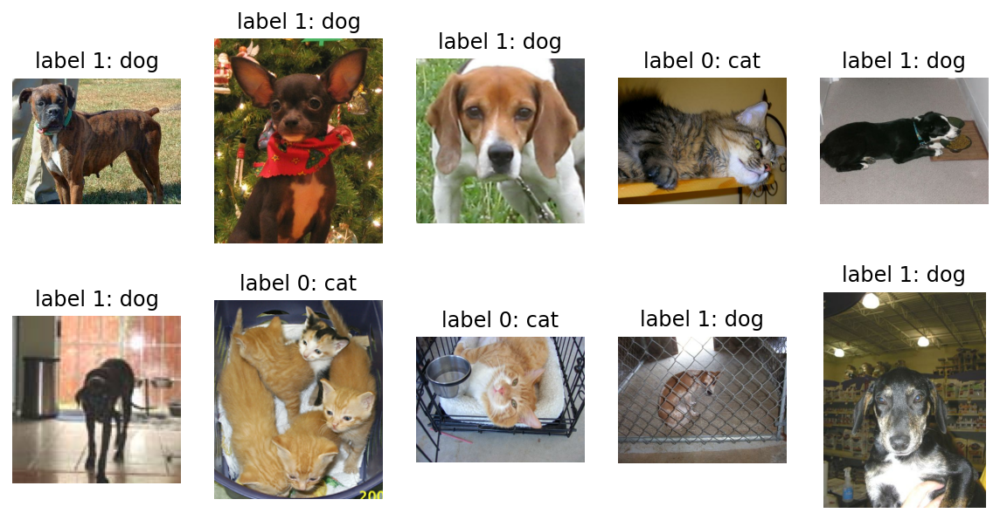

In [7]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

### **IMAGE RESIZED&SCALING**

In [8]:
IMG_SIZE = 160 # All images will be resized to 160x160

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

In [9]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

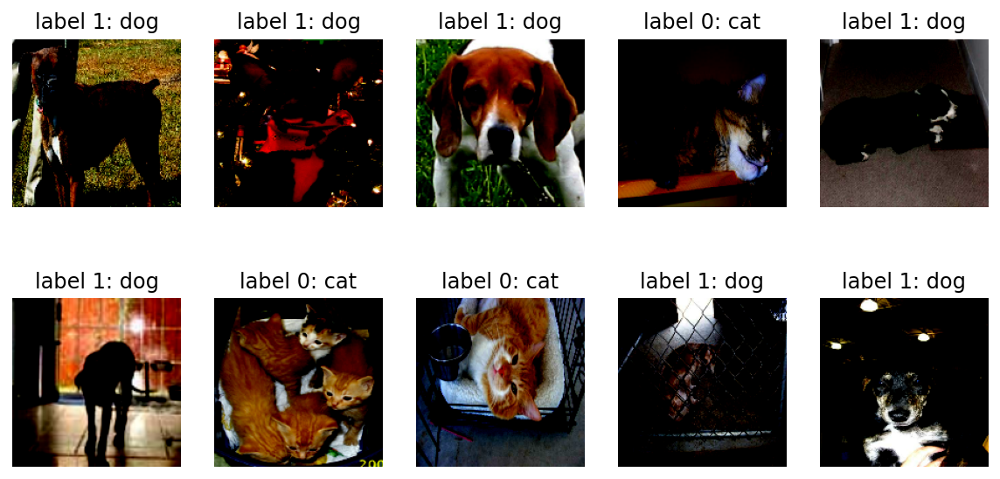

In [10]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')
#matplotlib으로 이미지를 시각화하려면 모든 픽셀값이 양수여야 함 

### **MODEL NETWORK**

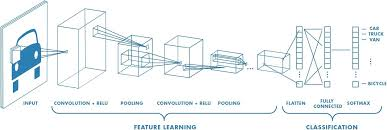

<br> 출처 : https://towardsdatascience.com/a-comprehensive-guide-to-convolutional-neural-networks-the-eli5-way-3bd2b1164a53

In [11]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import *

In [12]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=2, activation='softmax')
])

In [13]:
model.summary()
#layer1 

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 160, 160, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 80, 80, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 80, 80, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 40, 40, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 40, 40, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 20, 20, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 25600)             0

In [14]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])
#OPTIMIZER : 학습을 어떤 방식으로 시킬 것인지 결정합니다. 어떻게 최적화시킬 것인지를 결정하기 때문에 최적화 함수
#LOSS : 모델이 학습해나가야 하는 방향을 결정합니다(etc : hinge,binary,categorical 등)
#METRICS : 모델의 성능을 평가하는 척도입니다. 분류 문제를 풀 때, 성능을 평가할 수 있는 지표는 정확도(accuracy), 정밀도(precision), 재현율(recall) 등이 있습니다.

* Batch size : 한 번의 batch마다 주는 데이터의 샘플 size(mini-batch라고 표현)
* Iteration : epoch를 나누어서 실행하는 횟수 
* Epoch : 전체 Trainset를 한 번 학습 -> 10 Epoch면, 전체 Trainset를 10번 학습


> 메모리의 한계와 속도 저하 때문에 대부분의 경우에는 한 번의 epoch에서 모든 데이터를 한꺼번에 집어넣을 수는 없습니다. 그래서 데이터를 나누어서 주게 되는데 이때 몇 번 나누어 주는가를 iteration, 각 iteration마다 주는 데이터 사이즈를 batch size라고 부름



In [15]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000

train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

In [16]:
for image_batch, label_batch in train_batches.take(1):
    pass

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

In [17]:
validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

20/20 [==============================] - 1s 26ms/step - loss: 0.6925 - accuracy: 0.5109
initial loss: 0.69
initial accuracy: 0.51


In [24]:
EPOCHS = 10

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
      1/Unknown - 0s 5ms/step - loss: 0.0791 - accuracy: 0.9688WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.


Instructions for updating:
use `tf.profiler.experimental.stop` instead.


582/582 [==============================] - 27s 46ms/step - loss: 0.0827 - accuracy: 0.9747 - val_loss: 0.6496 - val_accuracy: 0.7992
Epoch 2/10
582/582 [==============================] - 26s 45ms/step - loss: 0.0598 - accuracy: 0.9816 - val_loss: 0.7013 - val_accuracy: 0.7997
Epoch 3/10
582/582 [==============================] - 26s 45ms/step - loss: 0.0409 - accuracy: 0.9888 - val_loss: 0.7965 - val_accuracy: 0.7941
Epoch 4/10
582/582 [==============================] - 26s 45ms/step - loss: 0.0306 - accuracy: 0.9927 - val_loss: 0.8231 - val_accuracy: 0.8001
Epoch 5/10
582/582 [==============================] - 26s 45ms/step - loss: 0.0265 - accuracy: 0.9924 - val_loss: 0.8964 - val_accuracy: 0.7966
Epoch 6/10
582/582 [==============================] - 26s 45ms/step - loss: 0.0201 - accuracy: 0.9947 - val_loss: 0.9713 - val_accuracy: 0.8018
Epoch 7/10
582/582 [==============================] - 26s 45ms/step - loss: 0.0155 - accuracy: 0.9960 - val_loss: 1.0300 - val_accuracy: 0.8001
Epo

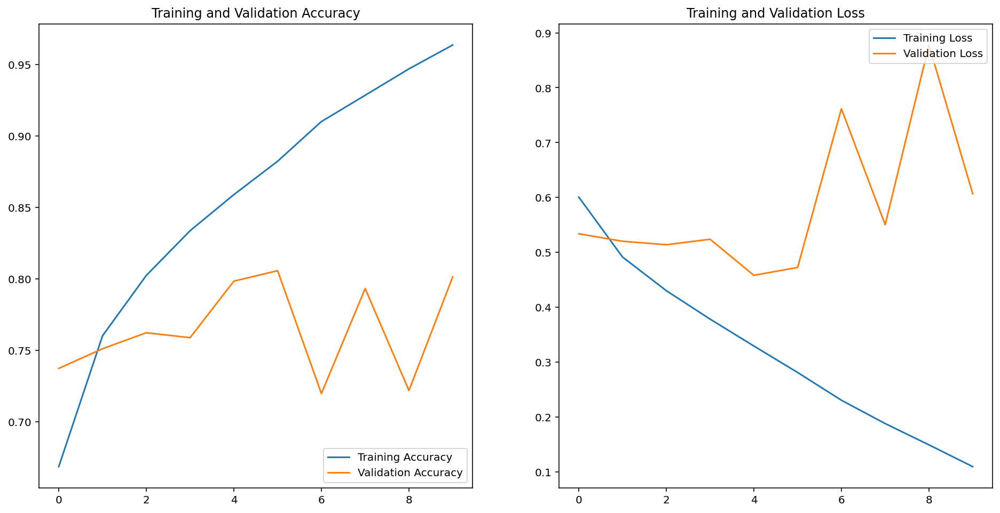

In [19]:
#matplotlib으로 그리는 방법 
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [38]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[9.9998248e-01, 1.7579308e-05],
       [8.6692035e-01, 1.3307969e-01],
       [4.0198789e-05, 9.9995983e-01],
       [9.9999762e-01, 2.3706546e-06],
       [2.9185504e-01, 7.0814496e-01],
       [6.6477922e-05, 9.9993348e-01],
       [2.2574375e-06, 9.9999774e-01],
       [9.8482817e-01, 1.5171818e-02],
       [7.4768046e-05, 9.9992526e-01],
       [1.2538294e-04, 9.9987459e-01],
       [3.7637929e-04, 9.9962366e-01],
       [8.3049931e-02, 9.1695011e-01],
       [9.3001437e-01, 6.9985583e-02],
       [1.4353819e-08, 1.0000000e+00],
       [9.9374384e-01, 6.2562213e-03],
       [9.9999976e-01, 2.8177971e-07],
       [1.0060818e-02, 9.8993915e-01],
       [1.8241175e-09, 1.0000000e+00],
       [1.1261420e-02, 9.8873854e-01],
       [9.9991441e-01, 8.5617867e-05],
       [4.7814399e-01, 5.2185601e-01],
       [1.1429513e-02, 9.8857051e-01],
       [9.9955851e-01, 4.4144242e-04],
       [9.8539913e-01, 1.4600927e-02],
       [4.1336220e-02, 9.5866376e-01],
       [1.1247118e-04, 9.

In [39]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1,
       0, 0, 1, 1, 0, 1, 0, 0, 0, 1])

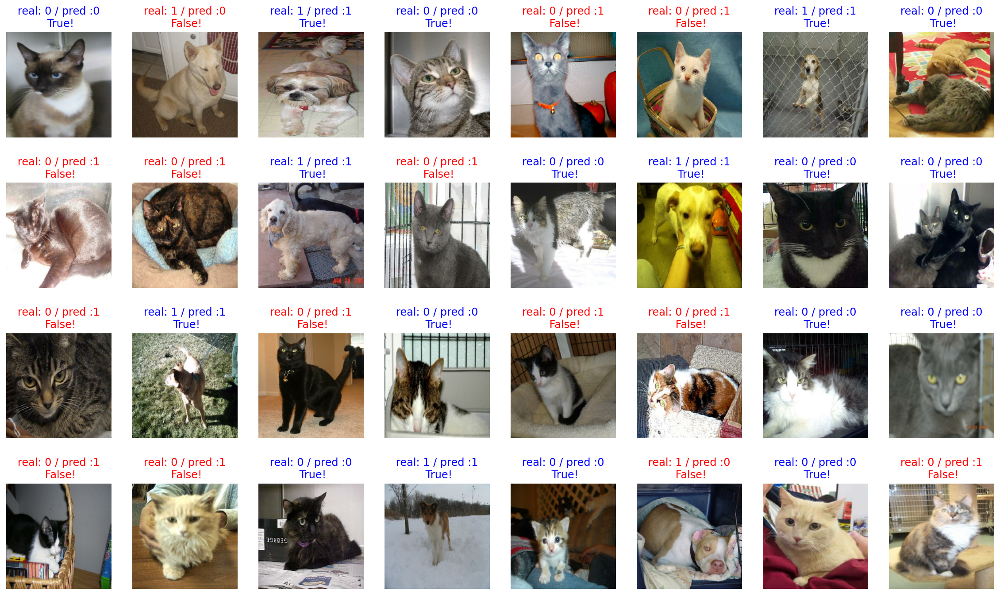

In [40]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [41]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(str(count / 32 * 100)+'% ACC')

56.25


TRANSFER LEARNING

## **TRANSFER LEARNING**

KEARS 라이브러리의 사전학습모델을 사용해서 학습 진행<br>

샤르트르식으로 표현하면 '거인의 어깨에 서서' 학습하는 것이라고 표현할 수도 있다. 컴퓨터 비전문제는 대부분 데이터가 큰 용량을 차지하고 있기 때문에 오랜 시간과 연산량을 줄이기 위해, 관례적으로 공개되어 있는 모델을 IMPORT해서 사용합니다

더욱 많은 모델을 보고 사용해보고 싶다면 ILSVRC에서 사용되었던 모델을 찾아보는게 좋습니다.<br>( ex : VGG , Alexnet, GoogleNet, ResNet etc)

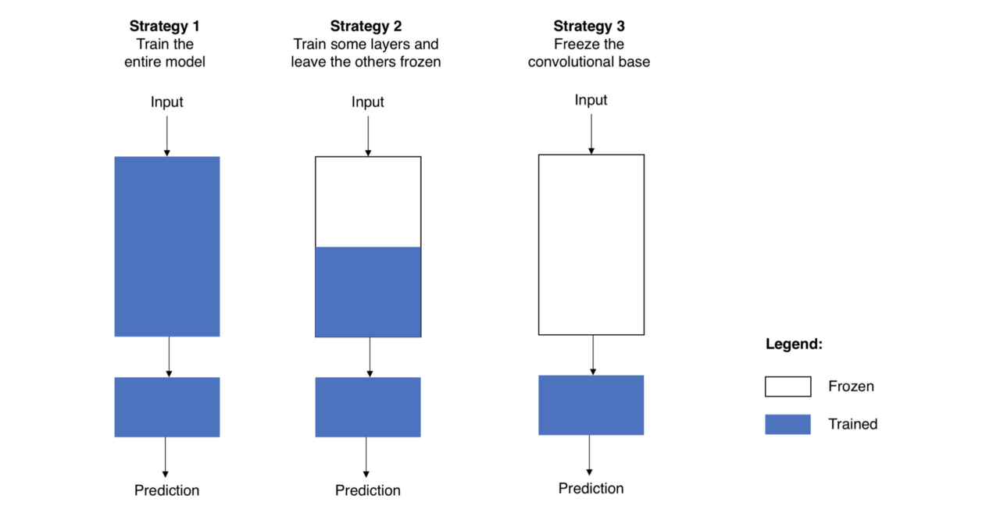

> Convolutional Base : 이미지로부터 특징을 효과적으로 추출하는 것
* 낮은 레벨계층 : input에 가까운 계층으로, 이미지에서 주로 일반적인(general) 특징을 추출한다.
* 높은 레벨계층 : output에 가까운 계층으로, 보다 구체적이고 특유한 특징을 추출한다.


<br>

> Classifier : 추출된 특징을 잘 학습해서 이미지를 알맞은 카테고리로 분류하는 것



### **IMPORT VGG16**

In [42]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

58892288/58889256 [==============================] - 0s 0us/step


In [43]:
image_batch.shape

TensorShape([32, 160, 160, 3])

In [44]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [45]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 160, 160, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 160, 160, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 80, 80, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 80, 80, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 80, 80, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 40, 40, 128)       0     

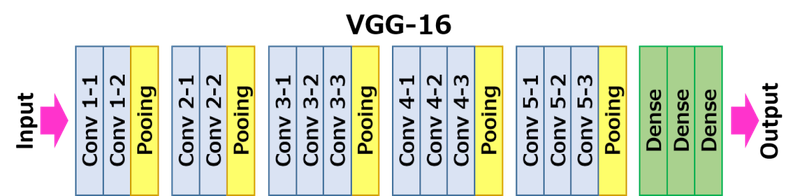

### **GLOBAL AVERAGE POOLING**

In [48]:
dense_layer = tf.keras.layers.Dense(512, activation='relu')
prediction_layer = tf.keras.layers.Dense(2, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

(32, 2)


In [ ]:
#vgg16에 해당되는 base_model 학습을 시키지 않을 예정 
base_model.trainable = False

**FINAL NETWORK MODEL**

In [50]:
#최종모델
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])

In [51]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 5, 5, 512)         14714688  
_________________________________________________________________
global_average_pooling2d (Gl (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 1026      
Total params: 14,978,370
Trainable params: 14,978,370
Non-trainable params: 0
_________________________________________________________________


In [52]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [53]:
validation_steps=20
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

20/20 [==============================] - 1s 32ms/step - loss: 0.7383 - accuracy: 0.5250
initial loss: 0.74
initial accuracy: 0.52


In [54]:
EPOCHS = 5   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/5
582/582 [==============================] - 84s 144ms/step - loss: 0.4230 - accuracy: 0.7886 - val_loss: 0.2063 - val_accuracy: 0.9140
Epoch 2/5
582/582 [==============================] - 83s 142ms/step - loss: 0.1723 - accuracy: 0.9351 - val_loss: 0.1560 - val_accuracy: 0.9437
Epoch 3/5
582/582 [==============================] - 83s 142ms/step - loss: 0.1317 - accuracy: 0.9545 - val_loss: 0.1256 - val_accuracy: 0.9523
Epoch 4/5
582/582 [==============================] - 83s 142ms/step - loss: 0.1254 - accuracy: 0.9595 - val_loss: 0.1043 - val_accuracy: 0.9596
Epoch 5/5
582/582 [==============================] - 83s 142ms/step - loss: 0.1000 - accuracy: 0.9668 - val_loss: 0.0927 - val_accuracy: 0.9639


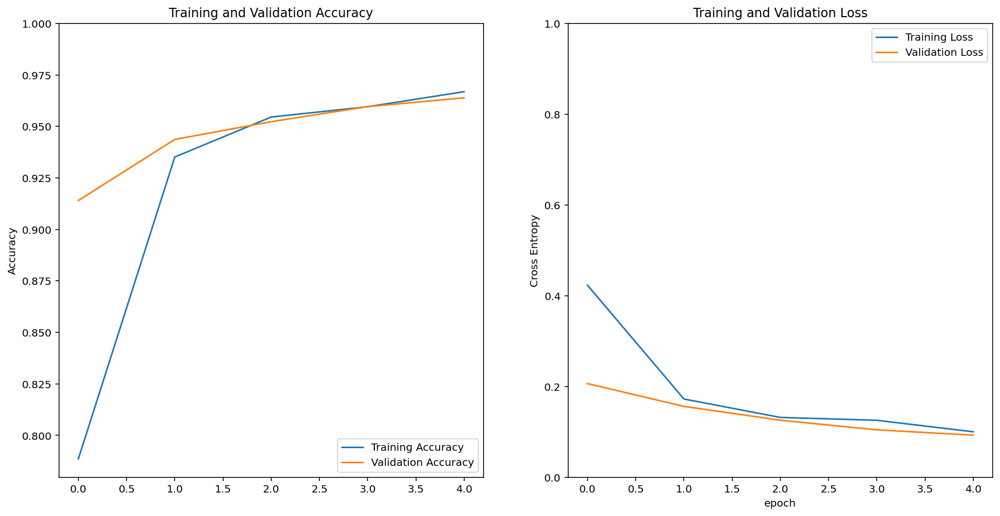

In [55]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [56]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[1.0000000e+00, 0.0000000e+00],
       [3.3508484e-06, 9.9999666e-01],
       [3.1923328e-03, 9.9680769e-01],
       [1.0000000e+00, 2.0005858e-14],
       [1.0000000e+00, 0.0000000e+00],
       [1.0000000e+00, 0.0000000e+00],
       [6.3088762e-14, 1.0000000e+00],
       [3.2940319e-01, 6.7059678e-01],
       [1.0000000e+00, 3.3613375e-27],
       [1.0000000e+00, 3.7590360e-13],
       [1.2588030e-27, 1.0000000e+00],
       [1.0000000e+00, 0.0000000e+00],
       [1.0000000e+00, 0.0000000e+00],
       [1.4494601e-07, 9.9999988e-01],
       [1.0000000e+00, 7.5342707e-16],
       [1.0000000e+00, 2.2644351e-38],
       [1.0000000e+00, 0.0000000e+00],
       [8.1792386e-04, 9.9918205e-01],
       [1.0000000e+00, 0.0000000e+00],
       [9.9999213e-01, 7.8535604e-06],
       [9.9999106e-01, 8.9238010e-06],
       [1.0000000e+00, 1.9060399e-10],
       [1.0000000e+00, 1.9641153e-21],
       [9.9992502e-01, 7.5020442e-05],
       [1.0000000e+00, 3.0861837e-20],
       [9.9959403e-01, 4.

In [57]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 1, 0, 0])

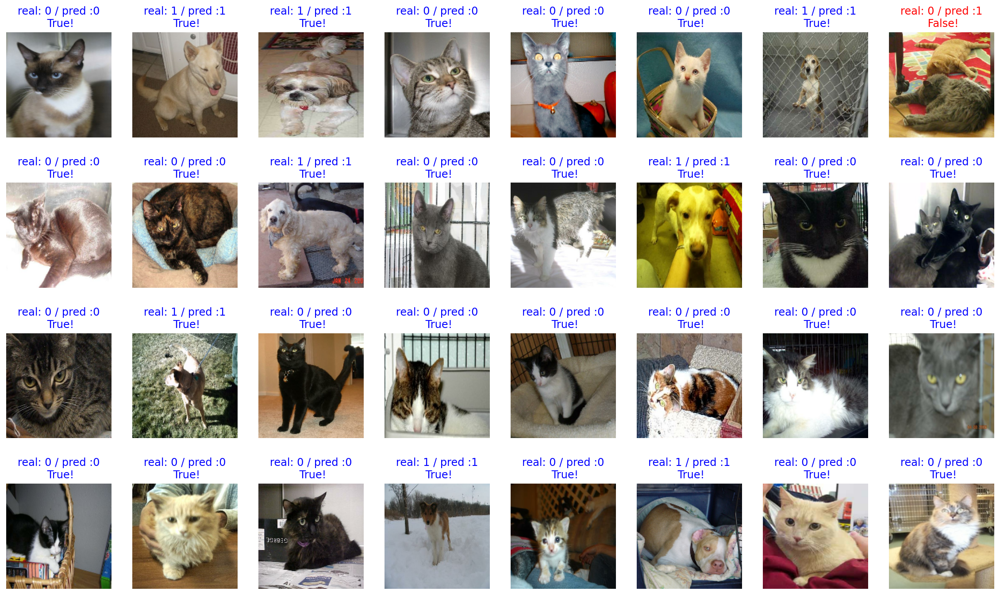

In [58]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [62]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(str(count / 32 * 100)+'% ACC') # 약 95% 내외

96.875% ACC


### **MODEL SAVE**

In [63]:
import os

checkpoint_dir = "/content/drive/My Drive/PROJECT_CHECKPOINT/cat_vs_dog/"
checkpoint_file_path = os.path.join(checkpoint_dir, 'checkpoint')

if not os.path.exists('checkpoint_dir'):
    os.mkdir('checkpoint_dir')
    
model.save_weights(checkpoint_file_path)     # checkpoint 파일 생성

if os.path.exists(checkpoint_file_path):
  print('checkpoint 파일 생성 OK!!')

checkpoint 파일 생성 OK!!
